# Import Libraries

In [1]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import numpy as np

from sklearn.metrics import classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense


# Read Data

In [2]:
path1 = r'/kaggle/input/chessman-image-dataset/Chessman-image-dataset/Chess'
categ = ["Bishop" , "King" , "Knight" , "Pawn" , "Queen" , "Rook"]
img_size = 256
df = []
for i in categ:
    path2 = os.path.join(path1 , i)
    cls_name = categ.index(i)
    for img in os.listdir(path2):
        img_array = cv2.imread(os.path.join(path2 , img))
        if img_array is None:
            print(f"Warning: Unable to read image --> Skipping...")
            continue
        img_array = cv2.cvtColor(img_array , cv2.COLOR_BGR2GRAY)
        new_array = cv2.resize(img_array , (256,256))
        df.append([new_array , cls_name])


random.shuffle(df)


# Split to images & target

In [3]:
# split train data
x_train =[]
y_train = []
for feature ,label in df:
  x_train.append(feature)
  y_train.append(label)

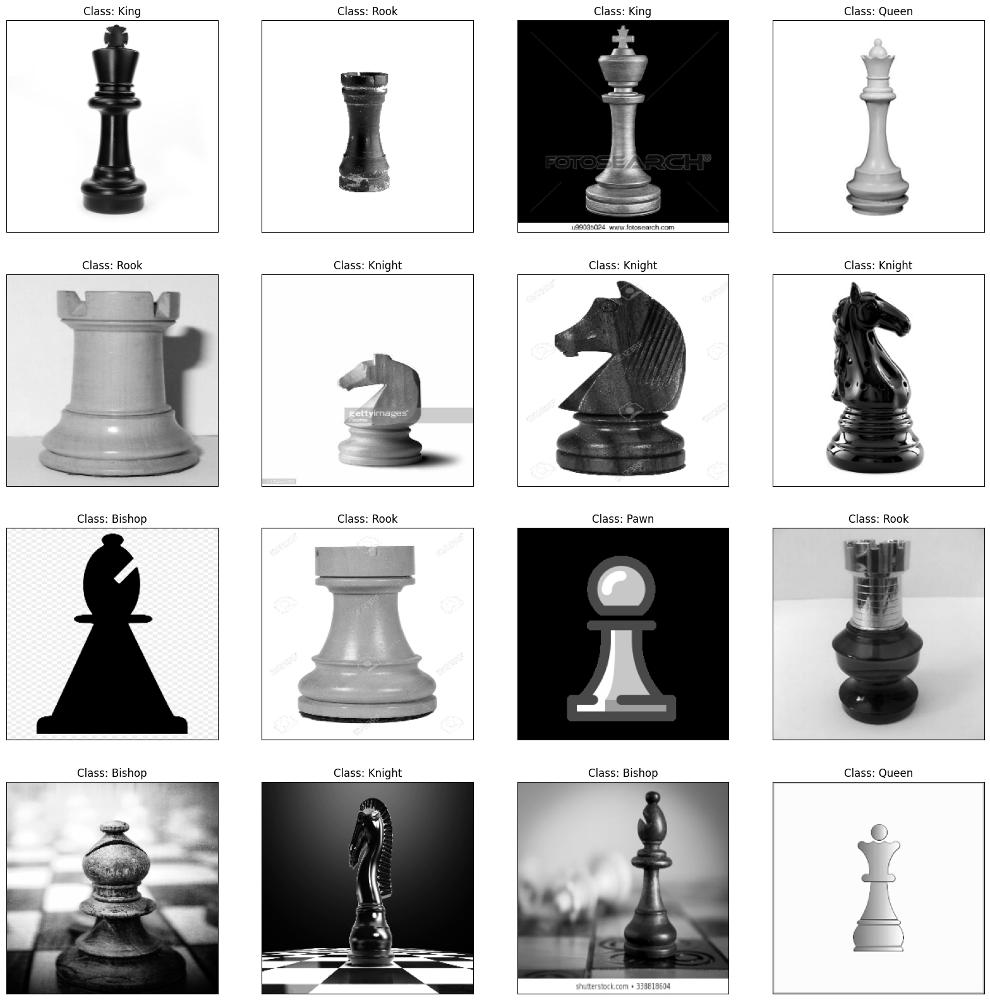

In [4]:
# show sample from data
def show(data):
    plt.figure(figsize=(20, 20))
    for i in range(16):
        plt.subplot(4, 4, i + 1)
    
        # Get the image and label
        img = data[i]
        label = y_train[i]
    
        # Display the image
        plt.imshow(img, cmap='gray' if len(img.shape) == 2 else None)
        plt.title(f"Class: {categ[label]}")
        plt.xticks([])
        plt.yticks([])

    plt.show()

    

# Preprocessing

In [5]:
# bluring
def blur(x_train):
    x_train_blurred = []
    kernel_size = 3  # Kernel size for median blur, must be odd

    for img in x_train:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            # Apply median blurring
            blurred_img = cv2.medianBlur(img, kernel_size)
            x_train_blurred.append(blurred_img)
    return x_train_blurred        
blured = blur(x_train)     

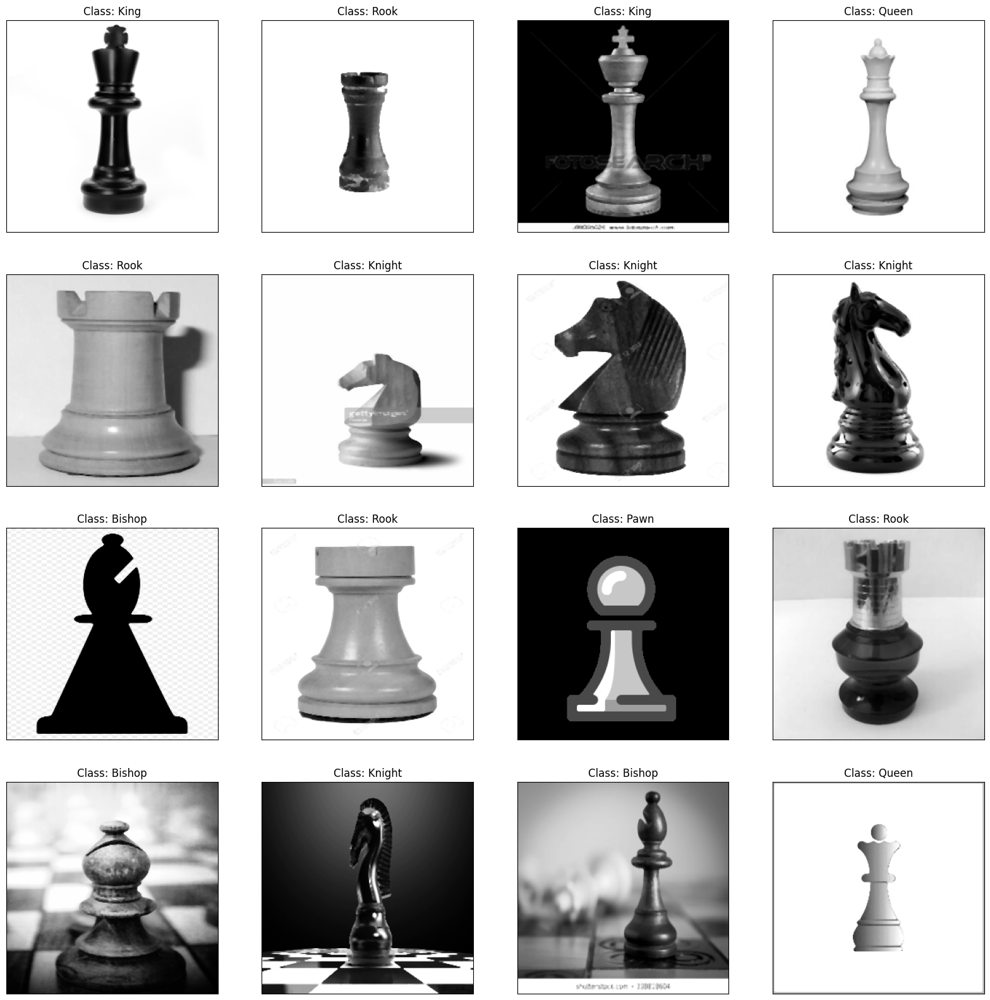

In [92]:

show(blured)

In [7]:
# Equalization
def equalization(data):
    equalized = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            equalized_img = cv2.equalizeHist(img)
            equalized.append(equalized_img)
        else:
            continue
    return equalized        



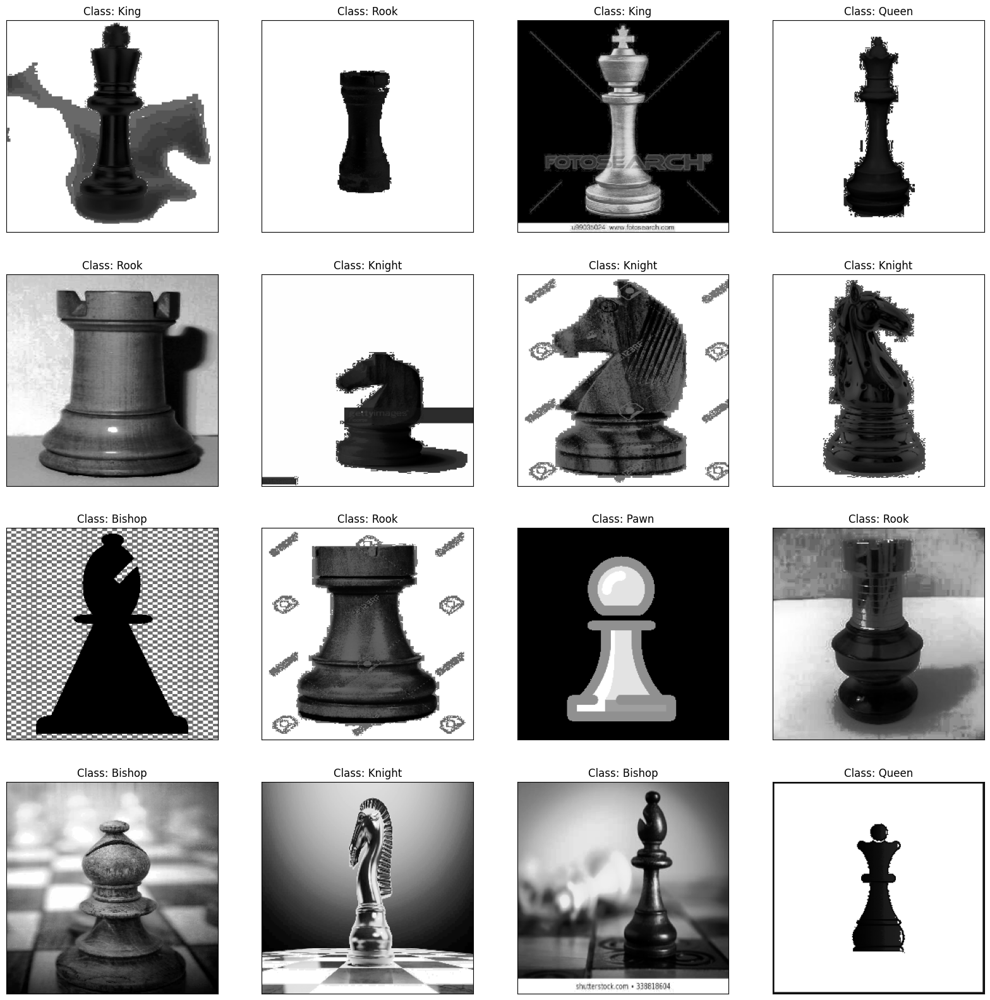

In [8]:
equalized = equalization(x_train)
show(equalized)

In [21]:
def dilation(data):
    # Dilation
    kernel = np.ones((5, 5), np.uint8)  # 5x5 square kernel
    dilate = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            dilated_image = cv2.dilate(img, kernel, iterations=1)
            dilate.append(dilated_image)
        else:
            print("Warning: Encountered a None image, skipping.")

    return dilate
dilate = dilation(x_train)

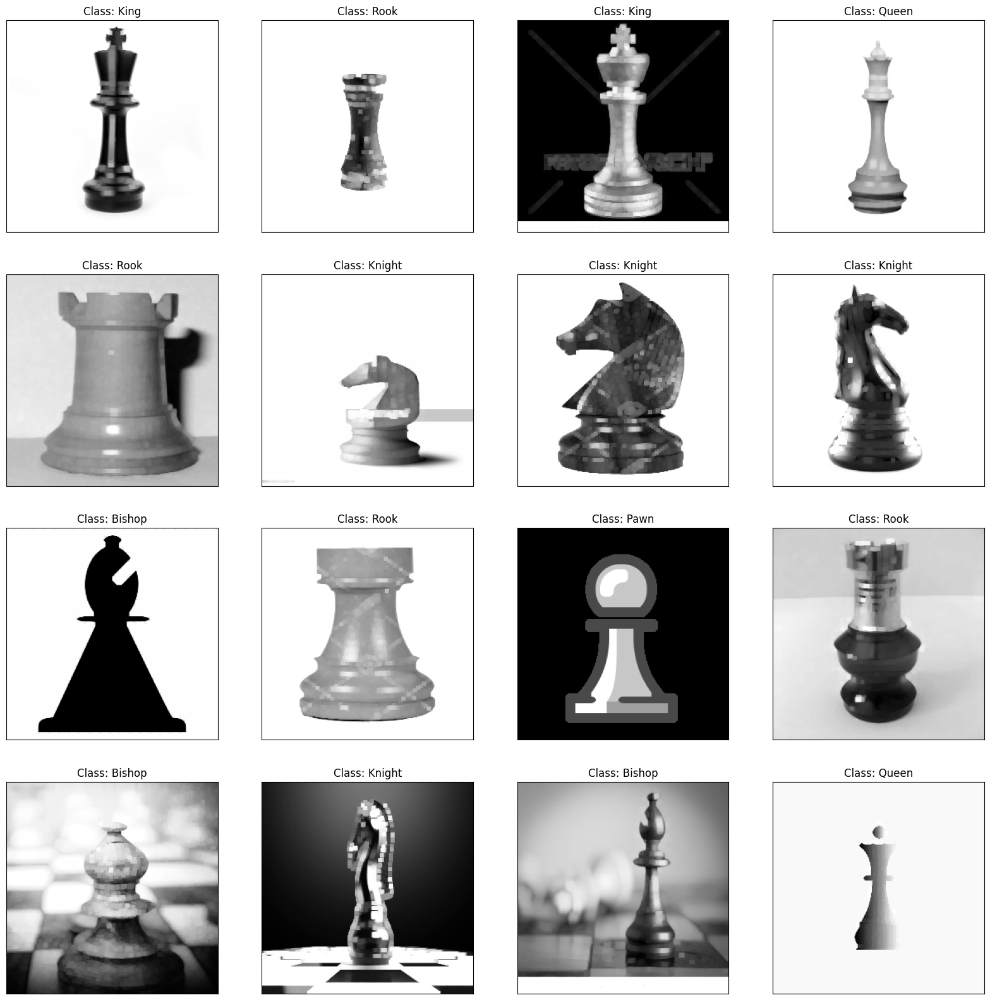

In [22]:
show(dilate)

In [97]:
def ero(data):
    # Define the kernel for erosion
    kernel = np.ones((3, 3), np.uint8)  
    erosion = []

    # Apply erosion to each image in the training set
    for img in data:
        # Ensure the image is in the proper format (e.g., NumPy array)
        if img is not None:
            # Apply erosion
            eroded_image = cv2.erode(img, kernel, iterations=1)
            erosion.append(eroded_image)
        else:
            print("Warning: Encountered a None image, skipping.")

    return erosion

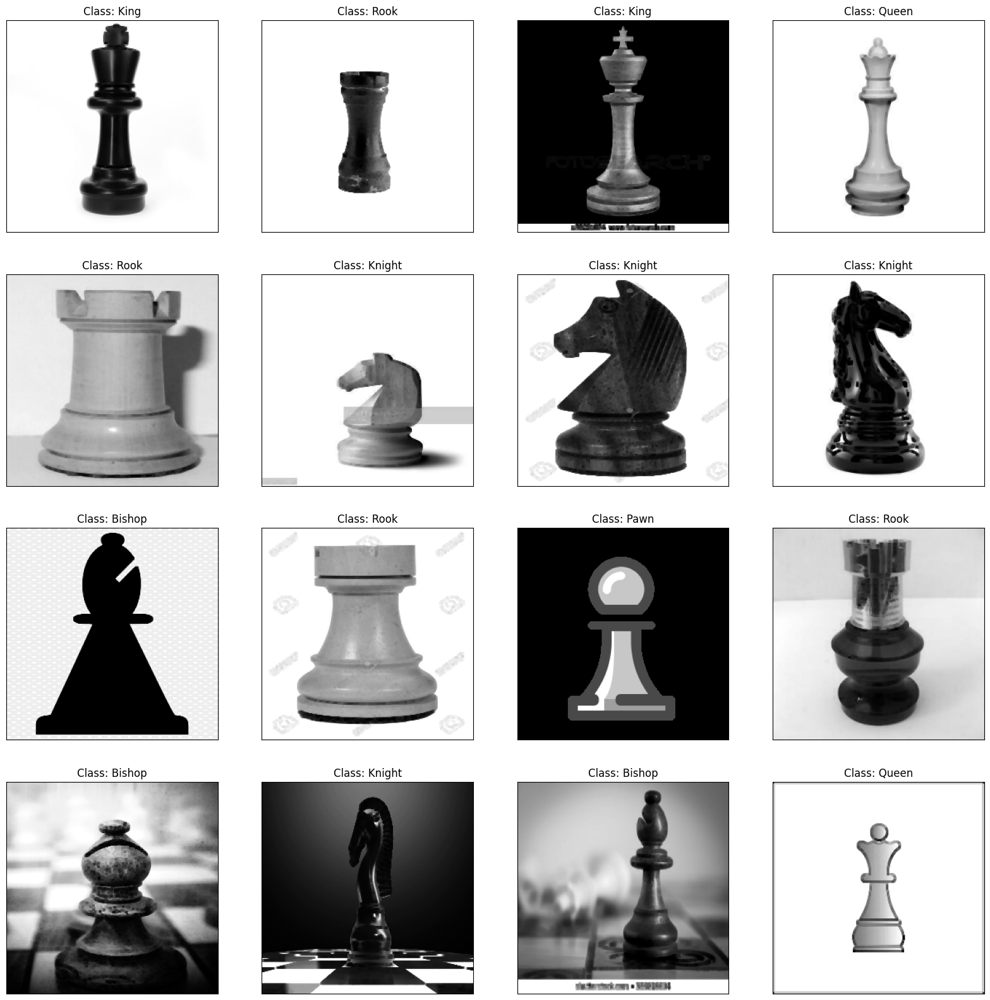

In [24]:
erosion = ero(x_train)
show(erosion)

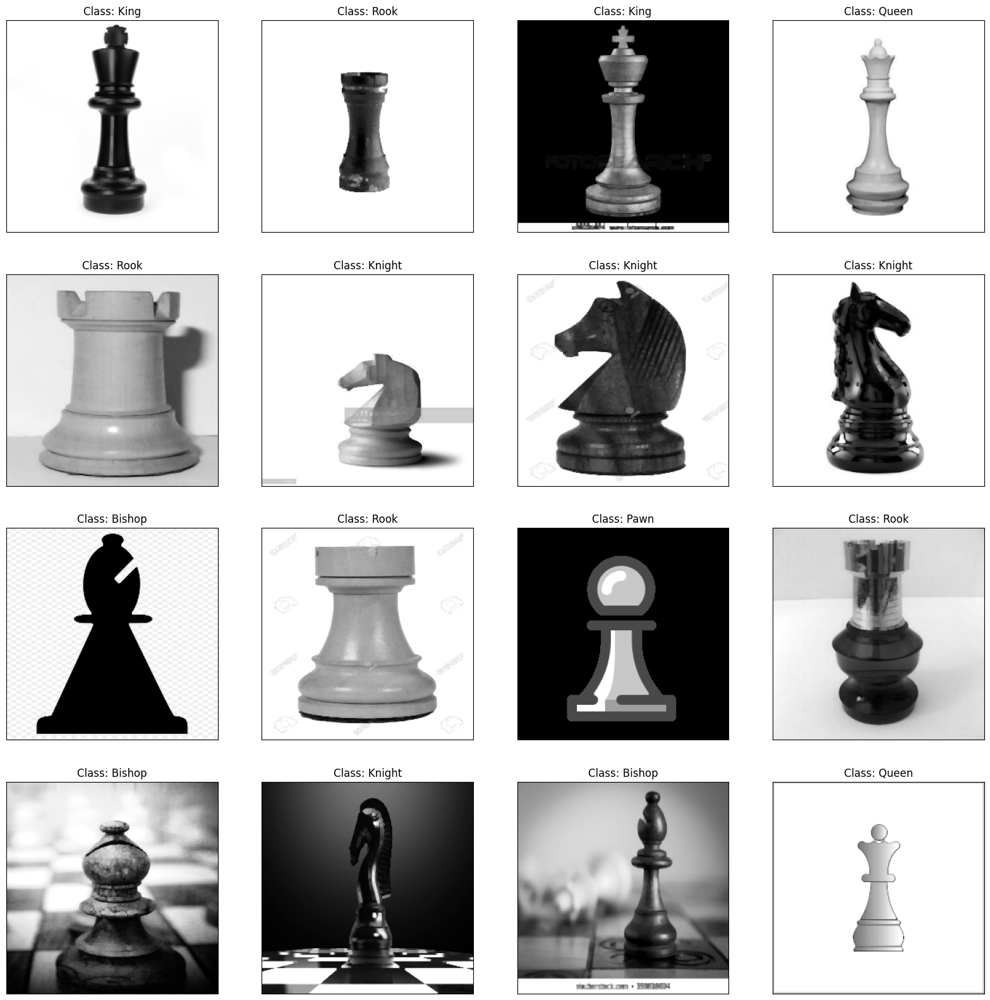

In [25]:
def open(data):
    # Define the kernel for morphological operations
    kernel = np.ones((3, 3), np.uint8) 
    opening = []
    # Apply opening and closing to each image in the training set
    for img in data:
        # Ensure the image is in the proper format (e.g., NumPy array)
        if img is not None:
            # Apply opening (erosion followed by dilation)
            opened_image = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
            opening.append(opened_image)
        else:
            print("Warning: Encountered a None image, skipping.")

    retuen opening
opening = open(x_train)
show(opening)

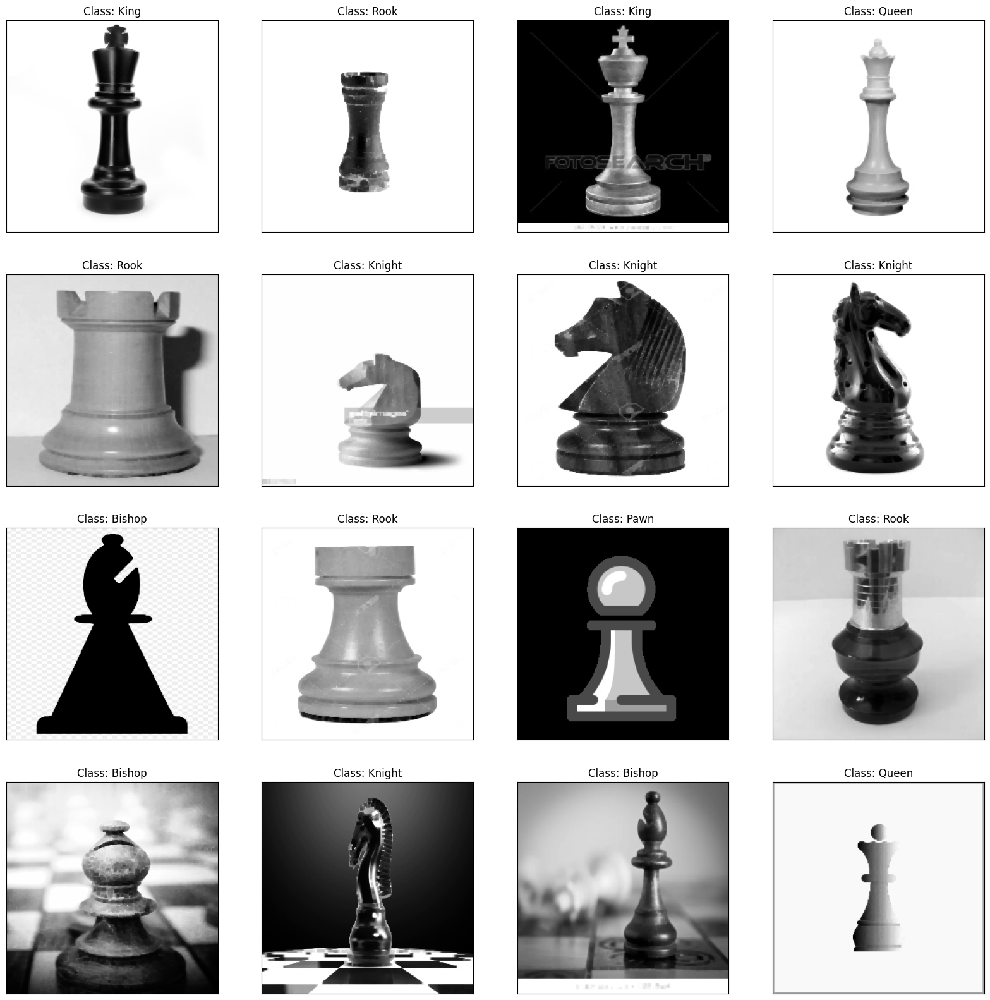

In [26]:
def close(data):
    # Define the kernel for morphological operations
    kernel = np.ones((3, 3), np.uint8)  

    # Initialize lists to store results
    closing = []

    # Apply opening and closing to each image in the training set
    for img in data:
        # Ensure the image is in the proper format (e.g., NumPy array)
        if img is not None:
            # Apply closing (dilation followed by erosion)
            closed_image = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
            closing.append(closed_image)
        else:
            print("Warning: Encountered a None image, skipping.")
    return closing

closing = close(x_train)
show(closing)

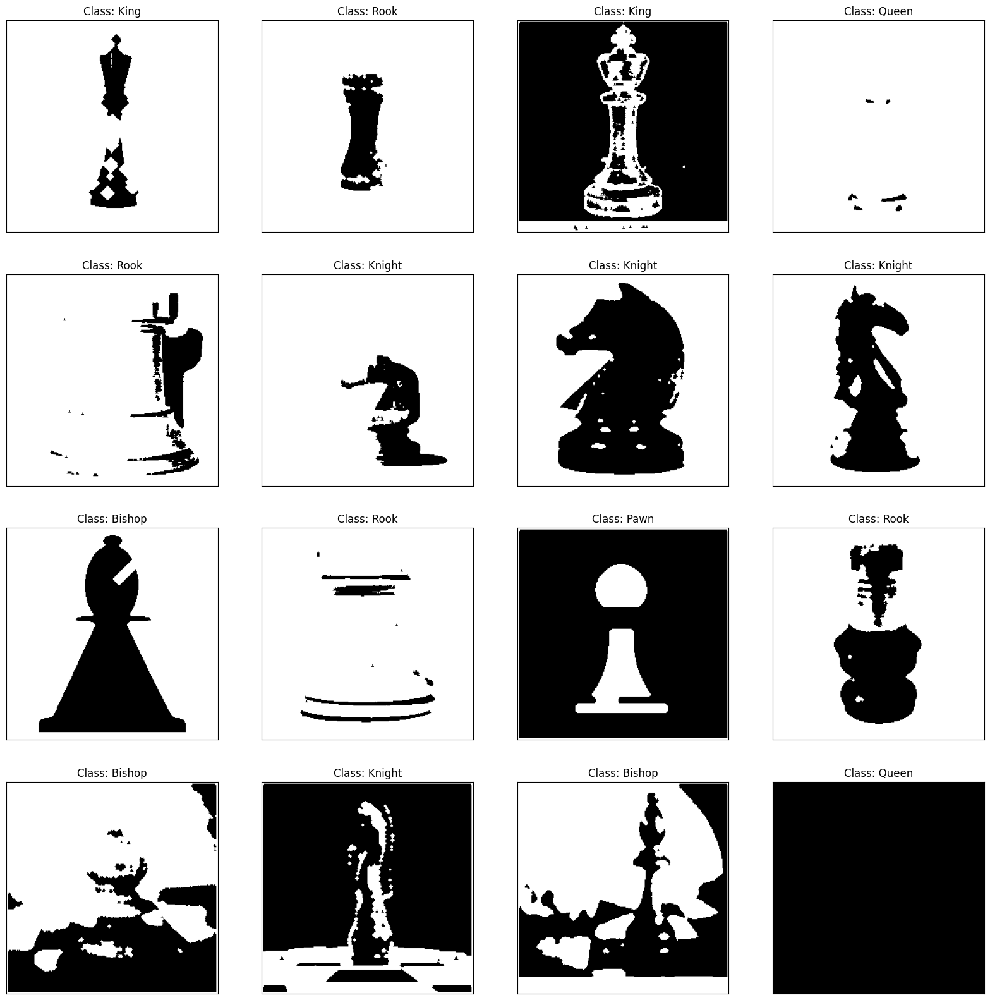

In [94]:
def hit_or_miss(data):
    # Construct the structuring element
    kernel = np.array([[ 1, 1, 1],
                       [ 0, 1, 0],
                       [ 0, 1, 0]], dtype='int') 
    hit_miss = []
    # Apply hit or miss operation
    for img in data:
        # Ensure the image is in the proper format (e.g., NumPy array)
        if img is not None:
            # Apply binary thresholding to get a binary image
            _, binary_image = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
        
            output_image = cv2.morphologyEx(binary_image, cv2.MORPH_HITMISS, kernel)
            hit_miss.append(output_image)
        else:
            print("Warning: Encountered a None image, skipping.")

    return hit_miss

hit_miss = hit_or_miss(x_train)
show(hit_miss)

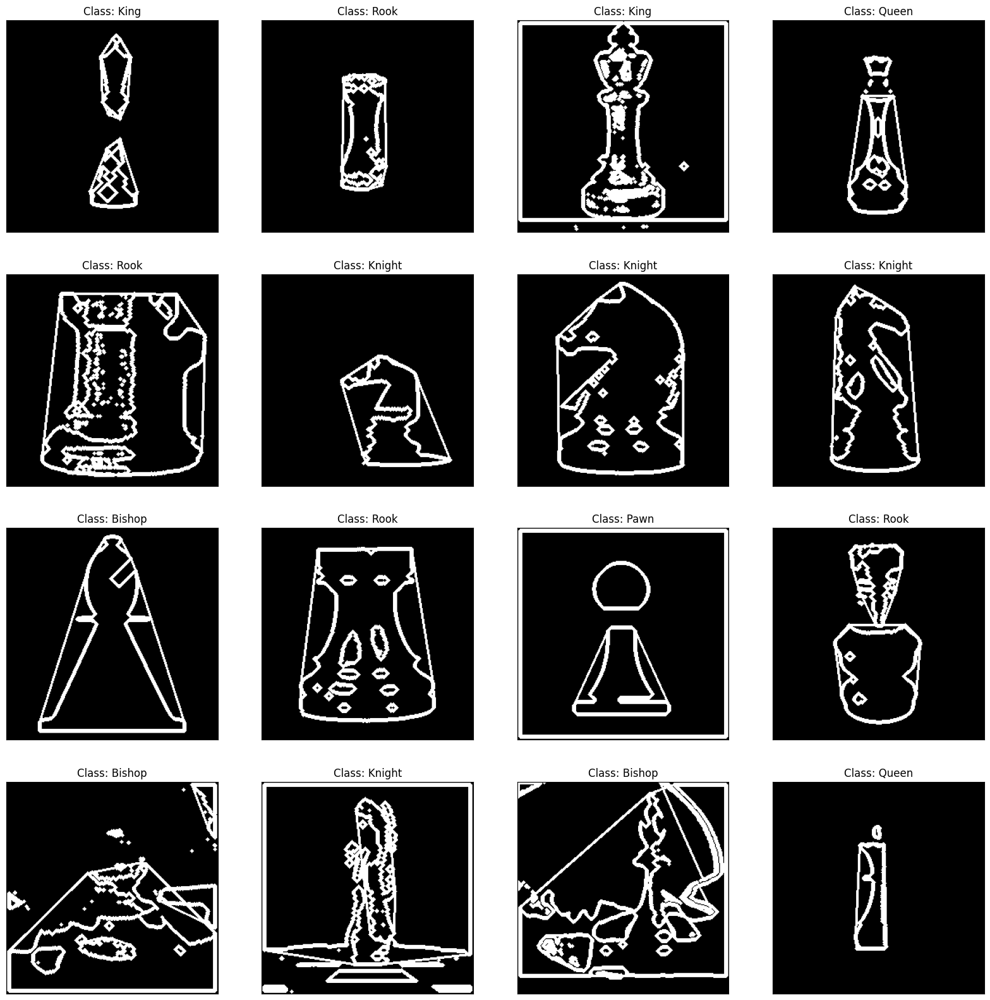

In [65]:
def convexHull(data):
    convex = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            # Apply threshold to get a binary image
            ret, binary = cv2.threshold(img, 100, 255, cv2.THRESH_OTSU)
            inverted_binary = ~binary  # Invert binary image

            # Find contours
            contours, hierarchy = cv2.findContours(inverted_binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            
            # Create a blank image to draw contours
            blank = np.zeros_like(img)
            cv2.drawContours(blank, contours, -1, (255, 0, 0), 3)  # Draw contours on blank

            # Loop through contours and draw convex hulls
            for contour in contours:
                convexHull = cv2.convexHull(contour)
                cv2.drawContours(blank, [convexHull], -1, (255, 0, 0), 2)

            convex.append(blank)  # Append the image with contours and convex hulls

        else:
            continue  # Skip if the image is None

    return convex

convx = convexHull(x_train)
show(convx)

# Segmentation

In [9]:
# segmentation using threshholding
def trunc_segment(data):
    segmented = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            _, thresh = cv2.threshold(img, 250, 255, cv2.THRESH_TRUNC)
            segmented.append(thresh)
        else:
            continue

    return segmented

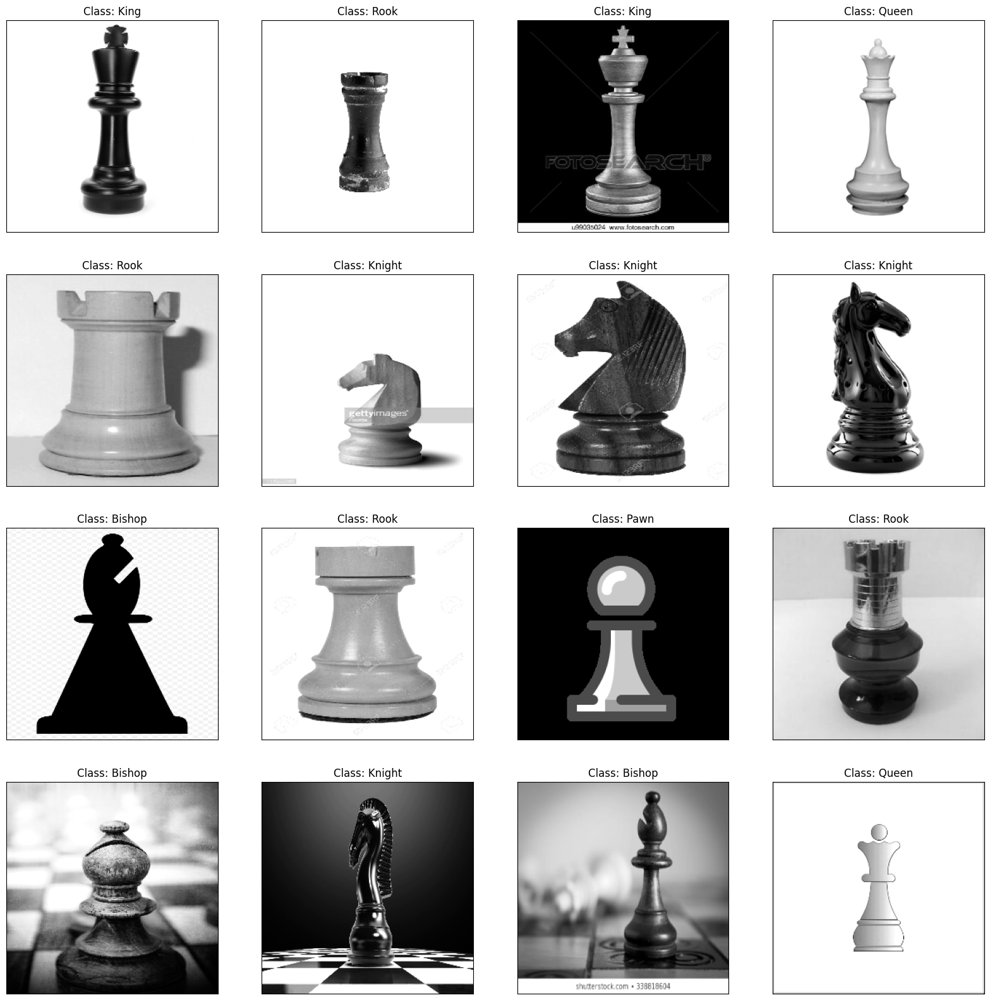

In [10]:
segmented_1 = trunc_segment(x_train)
show(segmented_1)

In [11]:
# segmentation using threshholding
def binary_segment(data):
    segmented = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            _, thresh = cv2.threshold(img, 250, 255, cv2.THRESH_BINARY_INV)
            segmented.append(thresh)
        else:
            continue

    return segmented

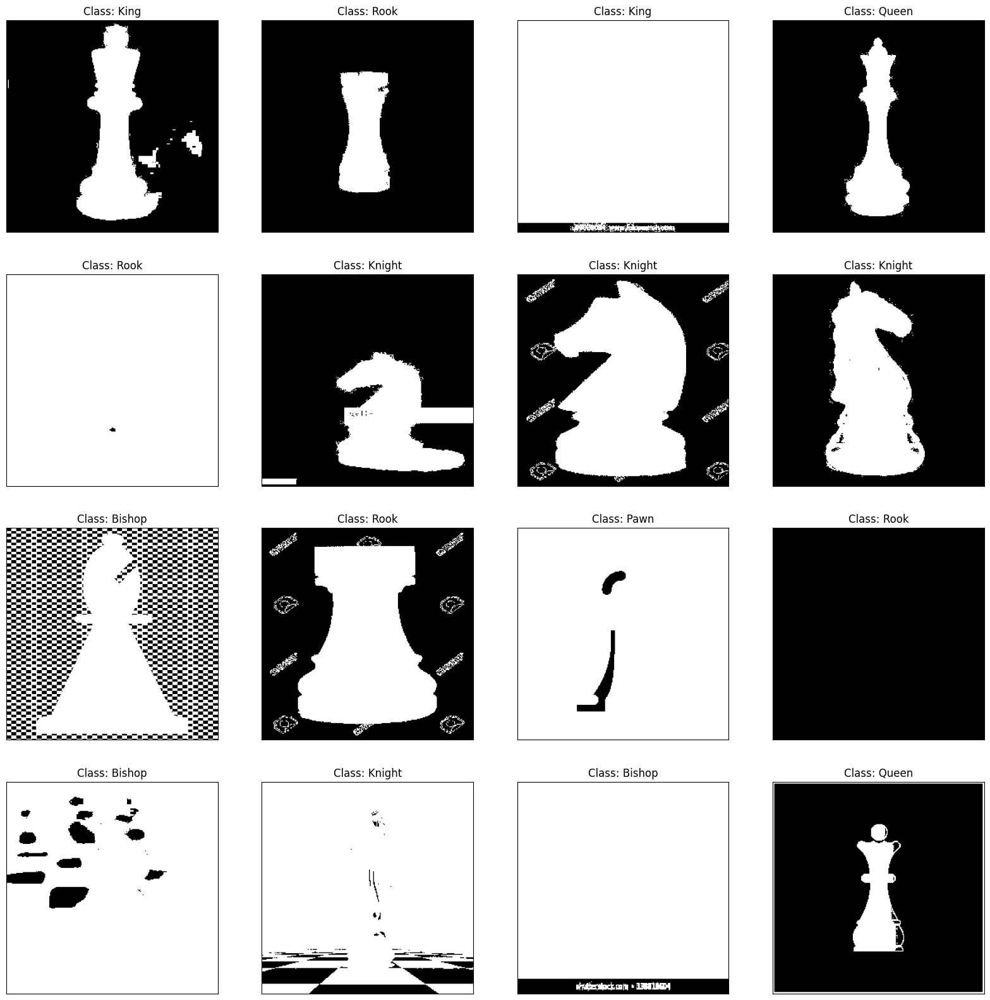

In [12]:
segmented_2 = binary_segment(x_train)
show(segmented_2)

In [13]:
# segmentation using threshholding
def tozero_segment(data):
    segmented = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            _, thresh = cv2.threshold(img, 250, 255, cv2.THRESH_TOZERO)
            segmented.append(thresh)
        else:
            continue

    return segmented

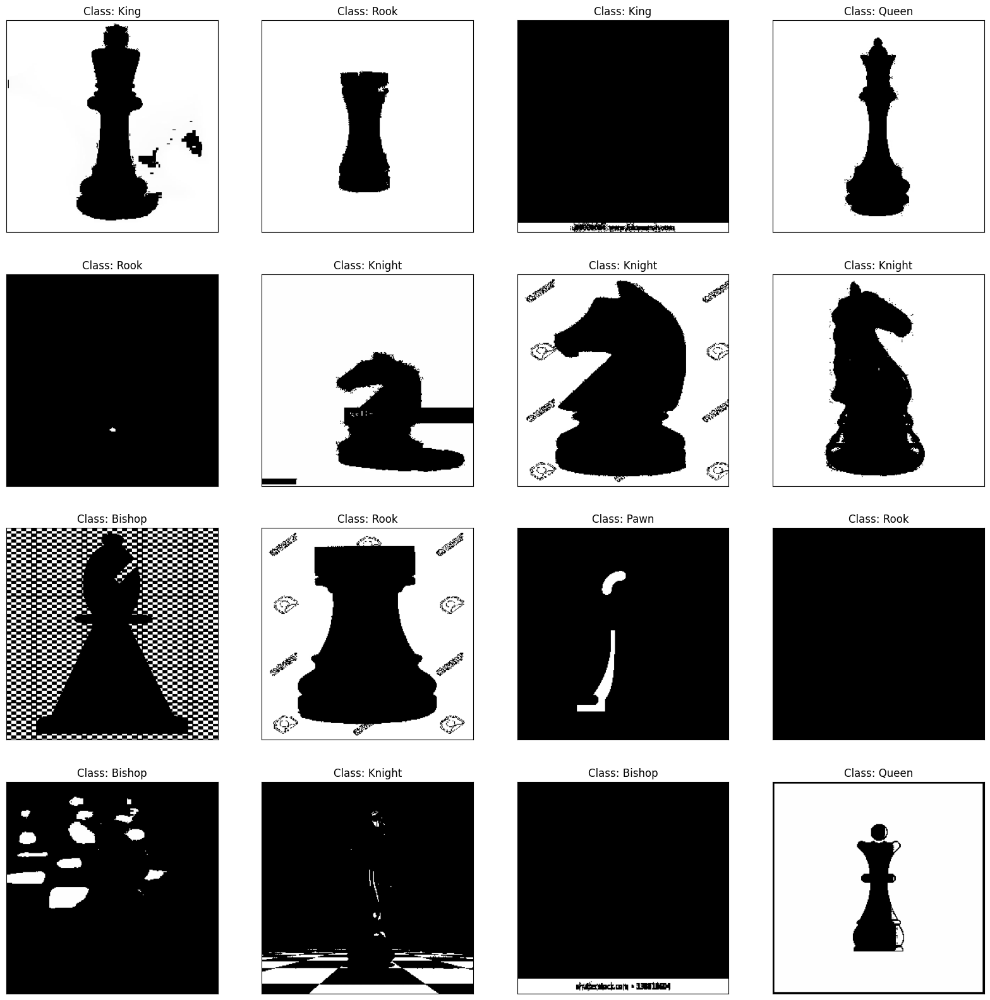

In [14]:
segmented_3 = tozero_segment(x_train)
show(segmented_3)

In [15]:
# segmentation using threshholding
def tozero_INV_segment(data):
    segmented = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            _, thresh = cv2.threshold(img, 250, 255, cv2.THRESH_TOZERO_INV)
            segmented.append(thresh)
        else:
            continue

    return segmented

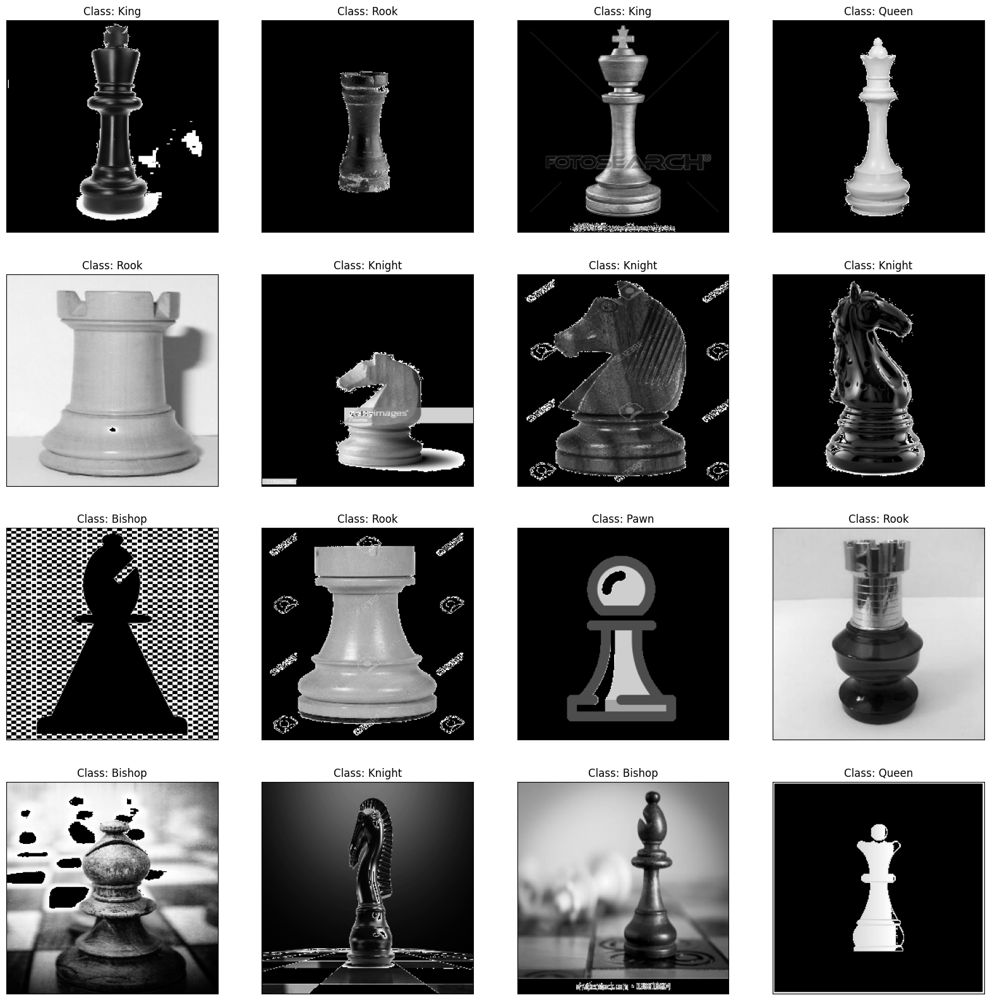

In [16]:
segmented_4 = tozero_INV_segment(x_train)
show(segmented_4)

In [17]:
# segmentation using threshholding
def otsu(data):
    segmented = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            _, thresh = cv2.threshold(img, 250, 255, cv2.THRESH_OTSU)
            segmented.append(thresh)
        else:
            continue

    return segmented

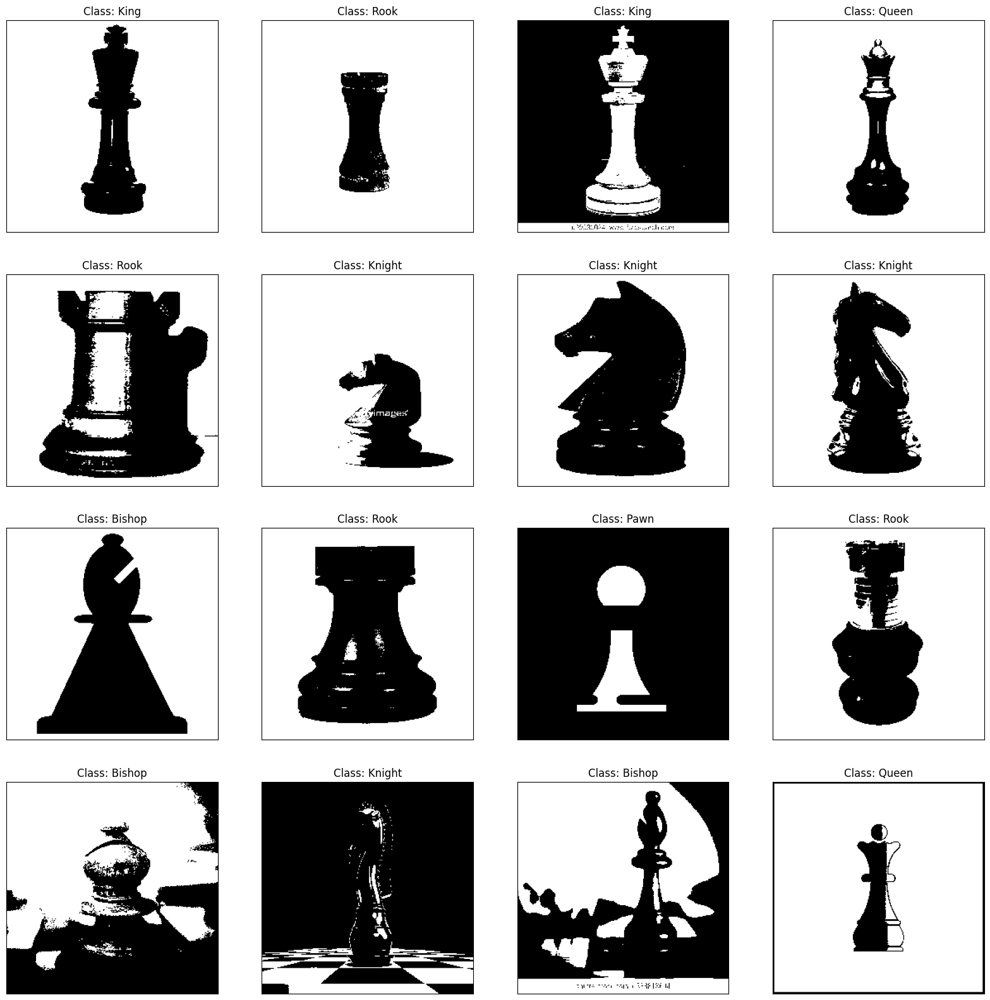

In [18]:
segmented_5 = otsu(x_train)
show(segmented_5)

In [19]:
# Apply Adaptive Thresholding
# segmentation using threshholding
def adaptive_thr(data):
    segmented = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, blockSize=11,  C=2  )
            segmented.append(thresh)
        else:
            continue

    return segmented

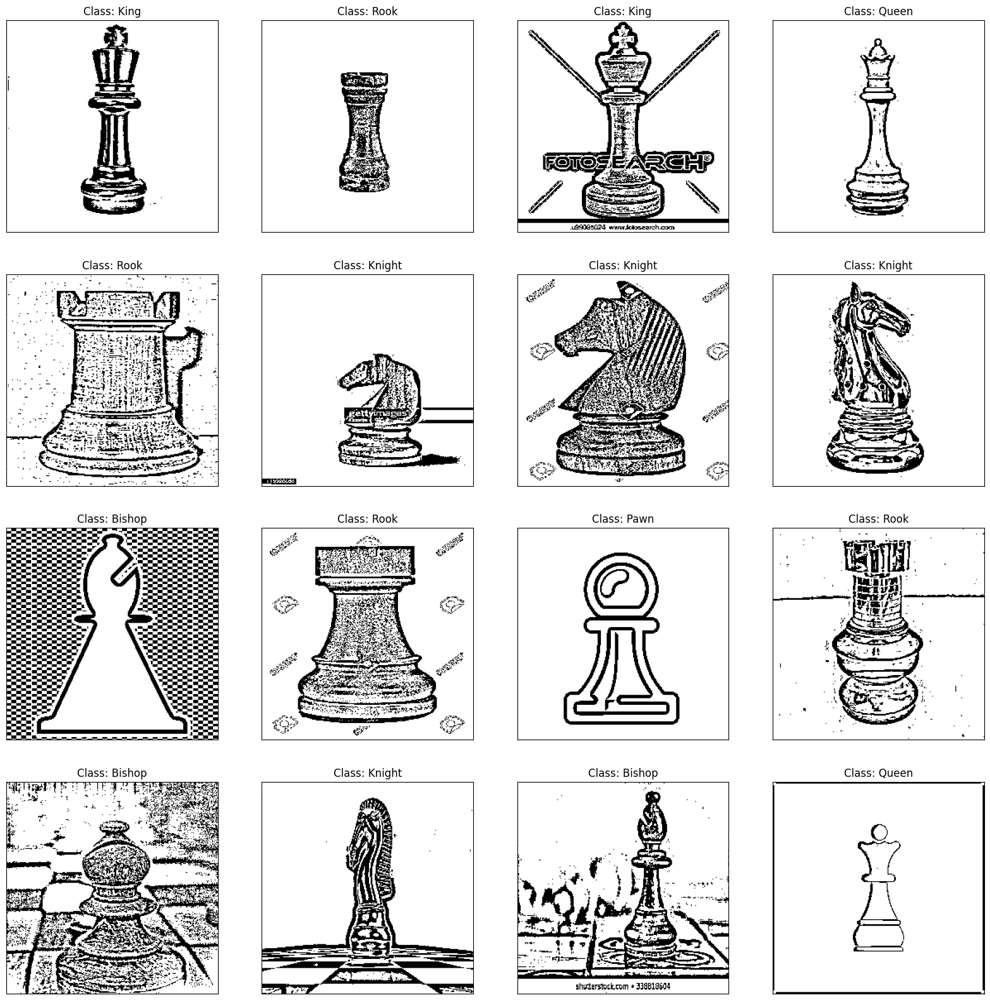

In [20]:
adaptive =  adaptive_thr(x_train)
show(adaptive)

# Feature Extraction

In [27]:
def lbp(data):
    # LBP
    # Assuming x_train is a list or array of grayscale images
    x_train_lbp = []

    # Process each image in the training set
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            # Create an empty image to store the LBP result
            newimg = np.zeros_like(img)
            # Get the dimensions of the image
            rows, cols = img.shape
            # Loop through the image excluding the border pixels
            for i in range(1, rows - 1):
                for j in range(1, cols - 1):
                    center_pixel = img[i, j]  # Center pixel
                    # Compare the center pixel with its neighbors and calculate the binary pattern
                    pixel7 = int(img[i - 1, j - 1] > center_pixel)  # Top-left
                    pixel6 = int(img[i - 1, j] > center_pixel)      # Top-center
                    pixel5 = int(img[i - 1, j + 1] > center_pixel)  # Top-right
                    pixel4 = int(img[i, j + 1] > center_pixel)      # Right
                    pixel3 = int(img[i + 1, j + 1] > center_pixel)  # Bottom-right
                    pixel2 = int(img[i + 1, j] > center_pixel)      # Bottom-center
                    pixel1 = int(img[i + 1, j - 1] > center_pixel)  # Bottom-left
                    pixel0 = int(img[i, j - 1] > center_pixel)      # Left
                    # Combine the binary values into a single decimal value
                    lbp_value = (pixel7 * 2**7 +
                                 pixel6 * 2**6 +
                                 pixel5 * 2**5 +
                                 pixel4 * 2**4 +
                                 pixel3 * 2**3 +
                                 pixel2 * 2**2 +
                                 pixel1 * 2 +
                                 pixel0)
                    # Store the LBP value in the new image
                    newimg[i, j] = lbp_value
        
            # Append the processed image to the LBP list
            x_train_lbp.append(newimg)
        else:
            print("Warning: Encountered a None image, skipping.")

    return x_train_lbp

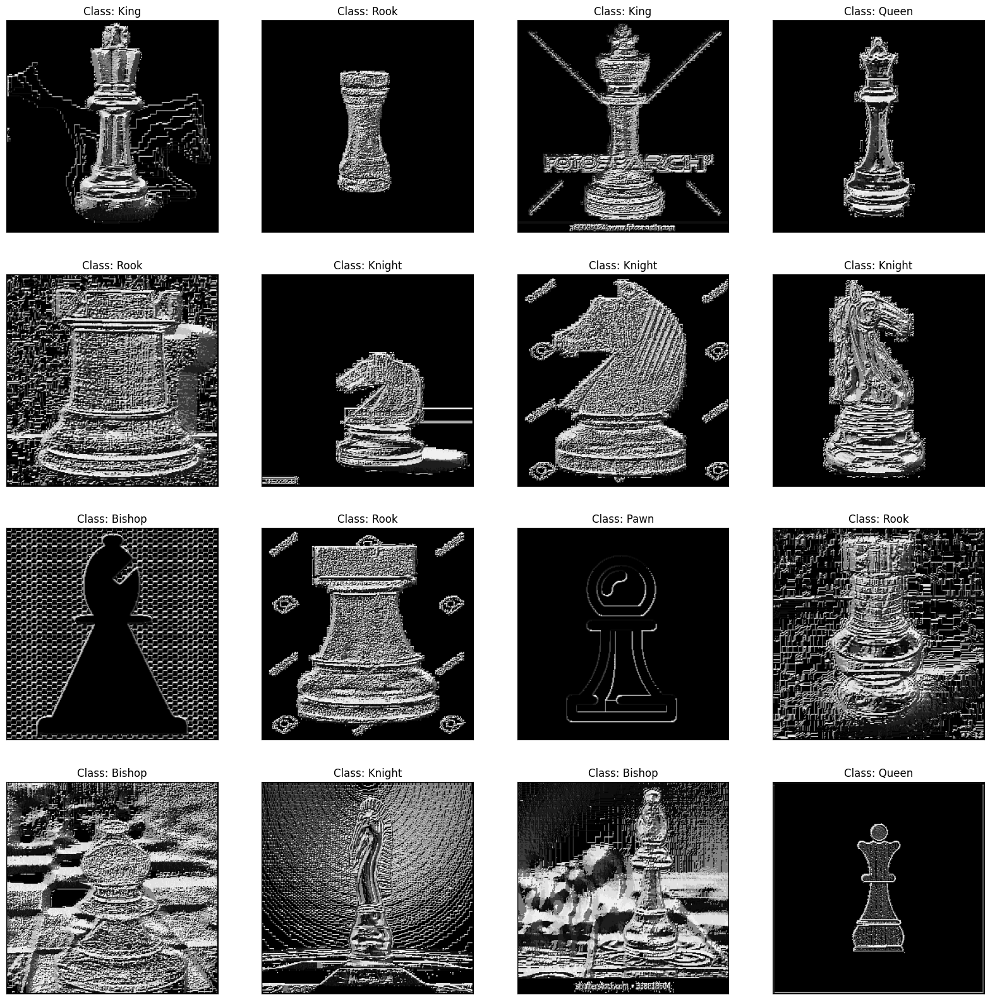

In [28]:
x_train_lbp = lbp(x_train)
show(x_train_lbp)

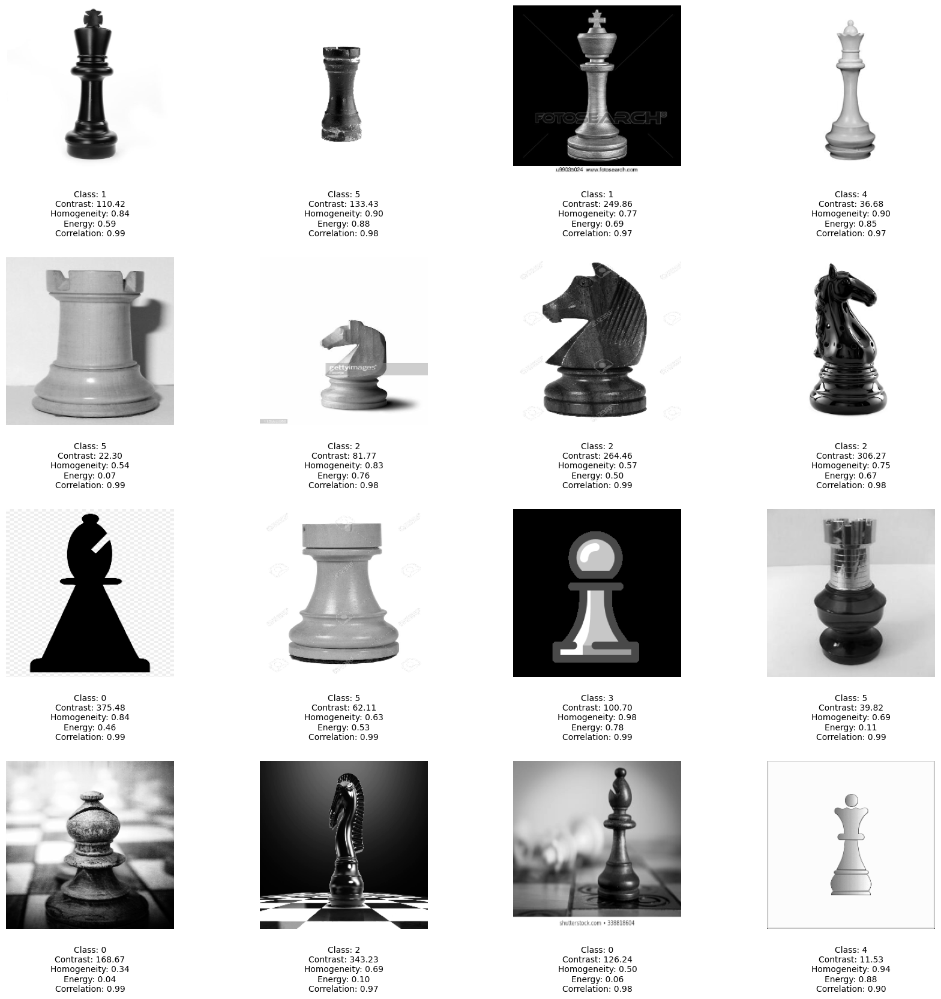

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops

def calculate_glcm_features(images, distances, angles):
    features = []
    for img in images:
        glcm = graycomatrix(
            img,
            distances=distances,
            angles=angles,
            levels=256,
            symmetric=True,
            normed=True
        )
        contrast = graycoprops(glcm, 'contrast')[0, 0]
        homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
        energy = graycoprops(glcm, 'energy')[0, 0]
        correlation = graycoprops(glcm, 'correlation')[0, 0]
        features.append([contrast, homogeneity, energy, correlation])
    return features

distances = [1]
angles = [0]
glcm_features = calculate_glcm_features(x_train[:16], distances, angles)

columns = ['Contrast', 'Homogeneity', 'Energy', 'Correlation']
features_df = pd.DataFrame(glcm_features, columns=columns)

fig, axes = plt.subplots(4, 4, figsize=(20, 20))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

for i, ax in enumerate(axes.flat):
    ax.imshow(x_train[i], cmap='gray' if len(x_train[i].shape) == 2 else None)
    ax.text(0.5, -0.1, f"Class: {y_train[i]}\nContrast: {features_df['Contrast'][i]:.2f}\nHomogeneity: {features_df['Homogeneity'][i]:.2f}\nEnergy: {features_df['Energy'][i]:.2f}\nCorrelation: {features_df['Correlation'][i]:.2f}",
            ha='center', va='top', transform=ax.transAxes, fontsize=10, color='black')
    ax.axis('off')

plt.show()

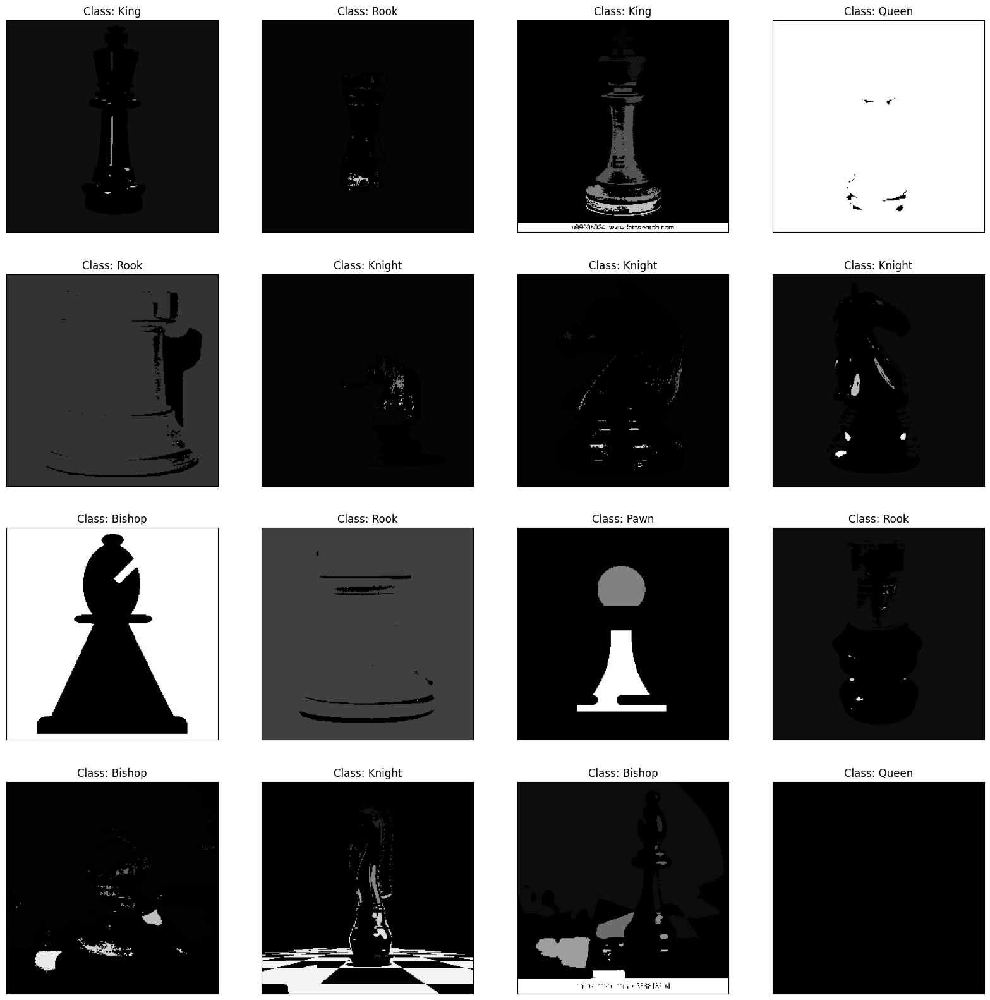

In [58]:
def extract_connected_components(data):
    connected = []
    for image in data:
        if len(image.shape) == 3:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
        _, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    
        num_labels, labels = cv2.connectedComponents(binary_image)
        connected.append(labels)
        

    return connected

connected = extract_connected_components(x_train)
show(connected)

# Chain code

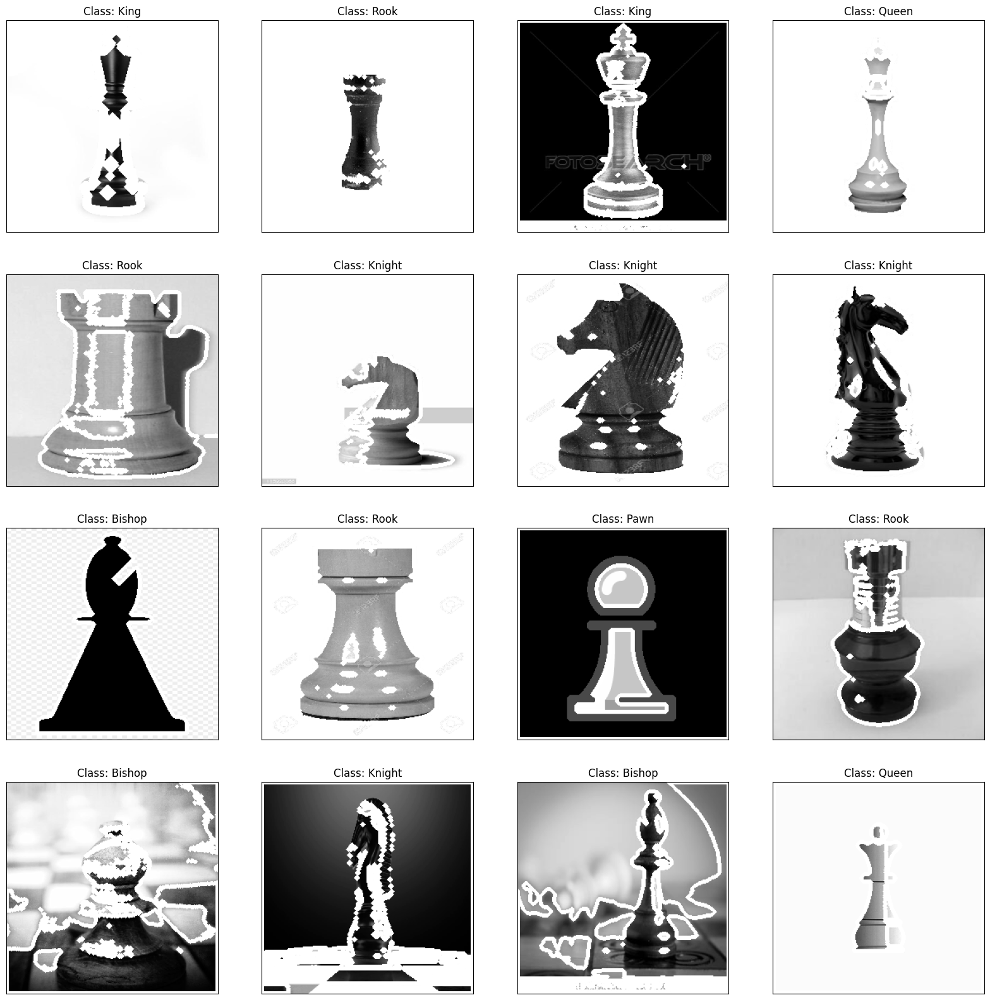

In [63]:
def contour_detect (data):
    contour = []
    for img in data:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            ret, binary = cv2.threshold(img, 100, 255, cv2.THRESH_OTSU)
            inverted_binary = ~binary

            contours, hierarchy = cv2.findContours(inverted_binary,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
            blank = np.zeros_like(img)
            contour_only = cv2.drawContours(img, contours, -1, (255,0,0), 3)
            contour.append(contour_only)
        else:
            continue

    return contour

contr = contour_detect(x_train)
show(contr)

# Edge Detection

In [33]:
def sobl(data):
    # sobel edge detection
    edges_3 = []
    for img in x_train:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)  # Edges in the x direction
            sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)  # Edges in the y direction
            sobel_combined = cv2.magnitude(sobel_x, sobel_y)  # Combine x and y gradients
            edges_3.append(sobel_combined)
        else:
            continue

    return edges_3



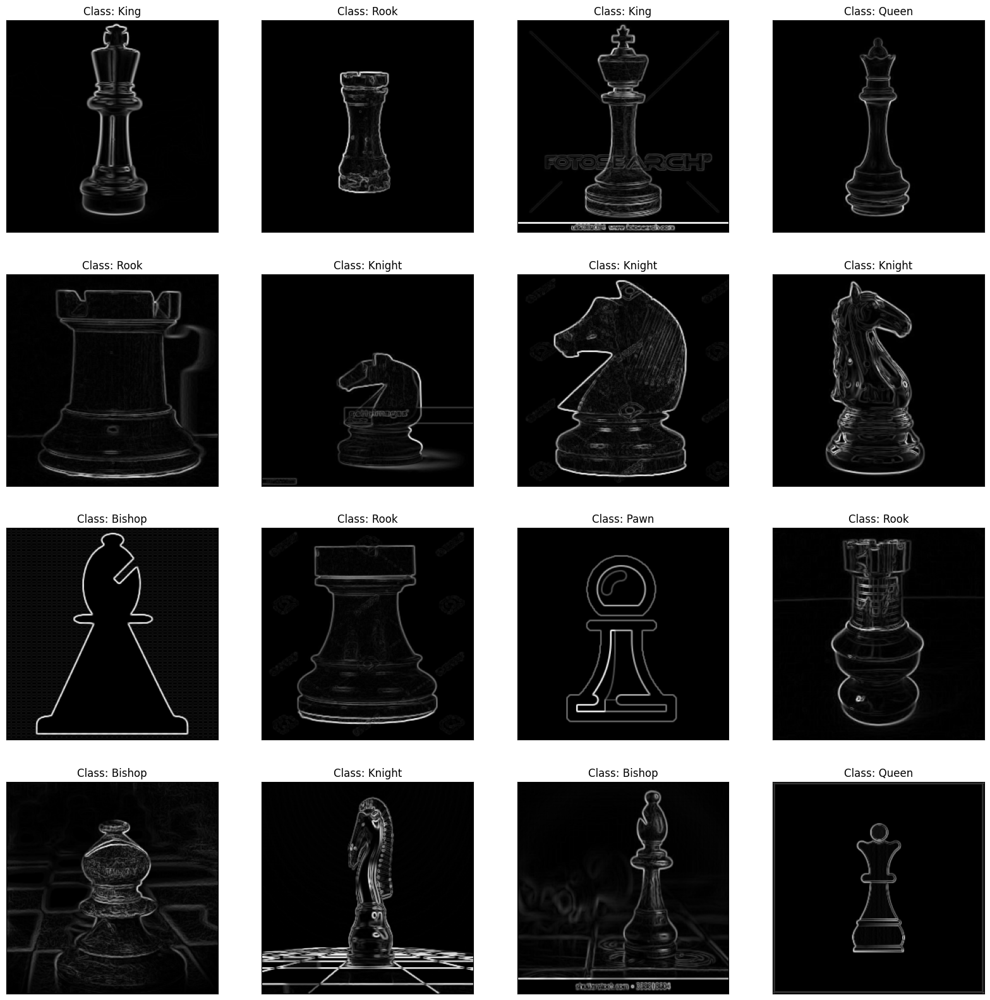

In [34]:
sobl_edgs = sobl(x_train)
show(sobl_edgs)

In [35]:
def lap(data):
    # prwit edge detection
    edges_4 = []

    for img in x_train:
        # Ensure the image is in proper format (e.g., NumPy array)
        if img is not None:
            laplacian = cv2.Laplacian(img, cv2.CV_64F, ksize=5)
            edges_4.append(laplacian)
        else:
            continue

    return edges_4

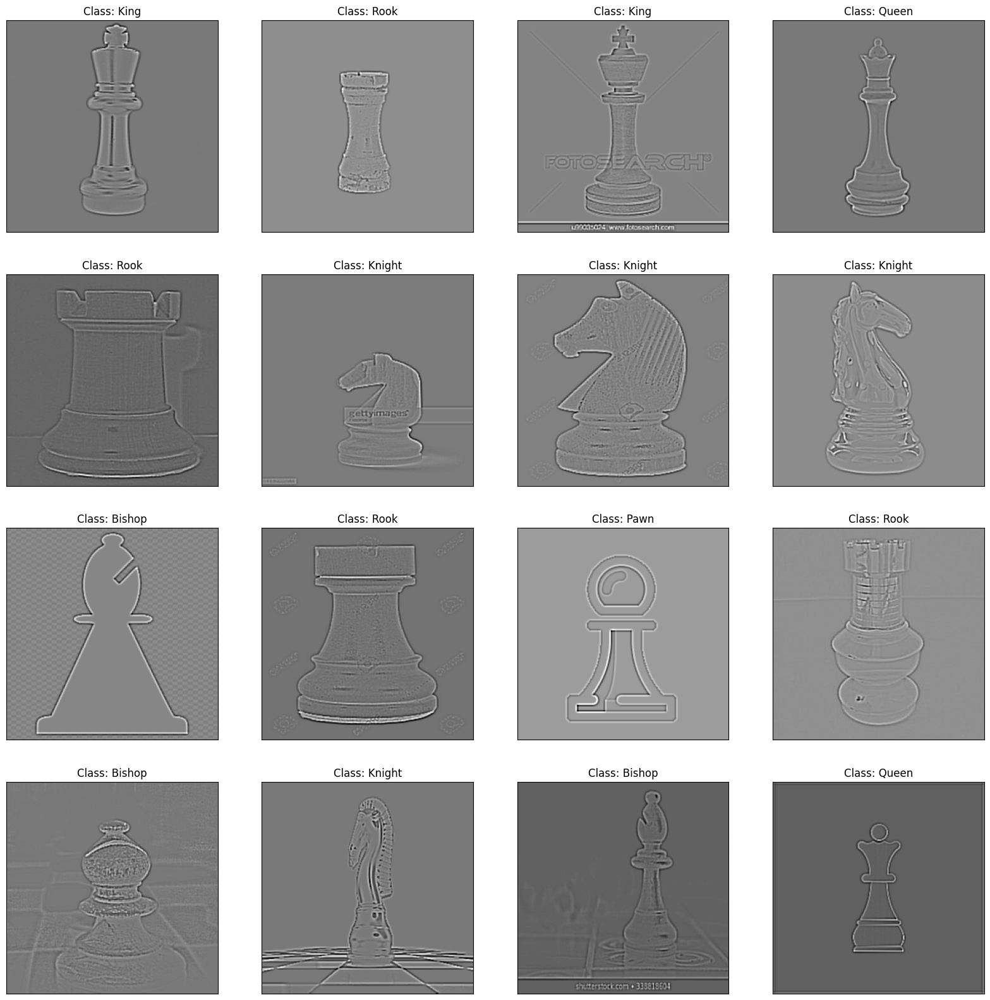

In [36]:
lap_edges = lap(x_train)
show(lap_edges)

# Choose the Best Preprocessing

In [37]:
x = blur(x_train)

In [38]:
x = equalization(x)

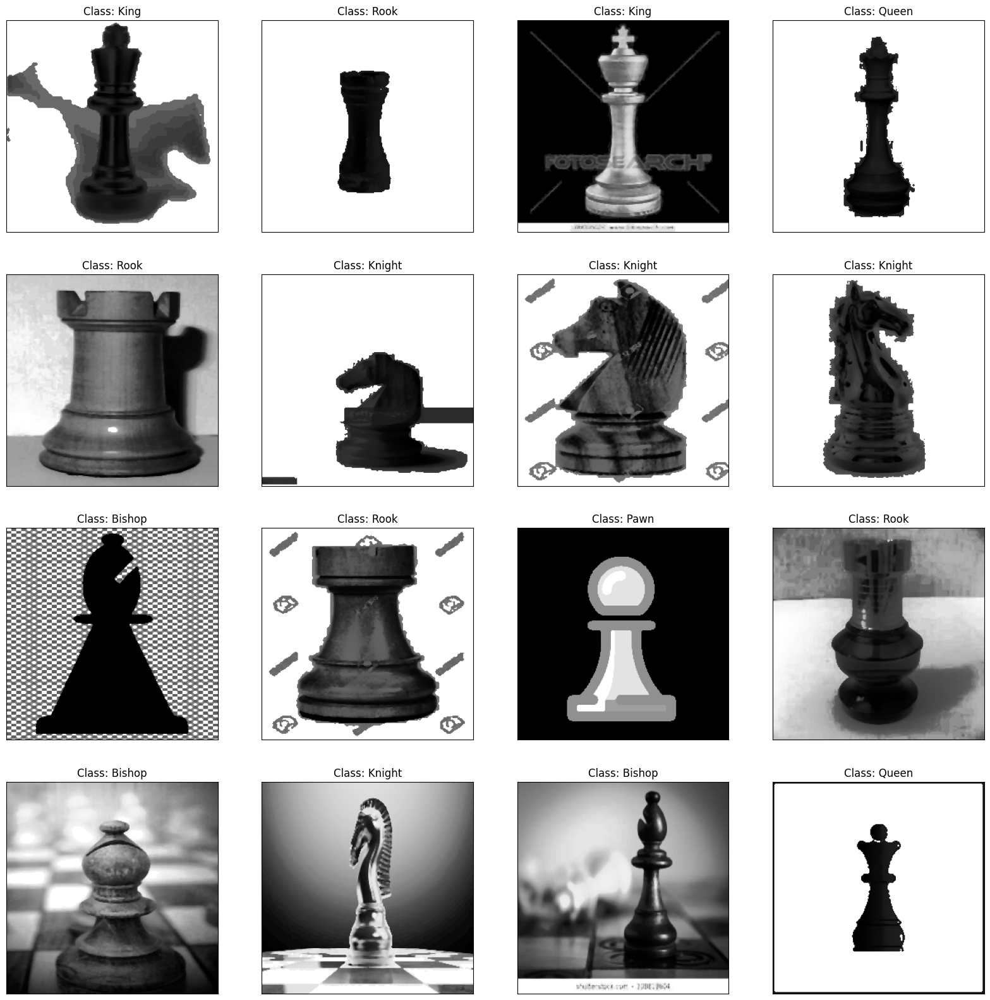

In [39]:
show(x)

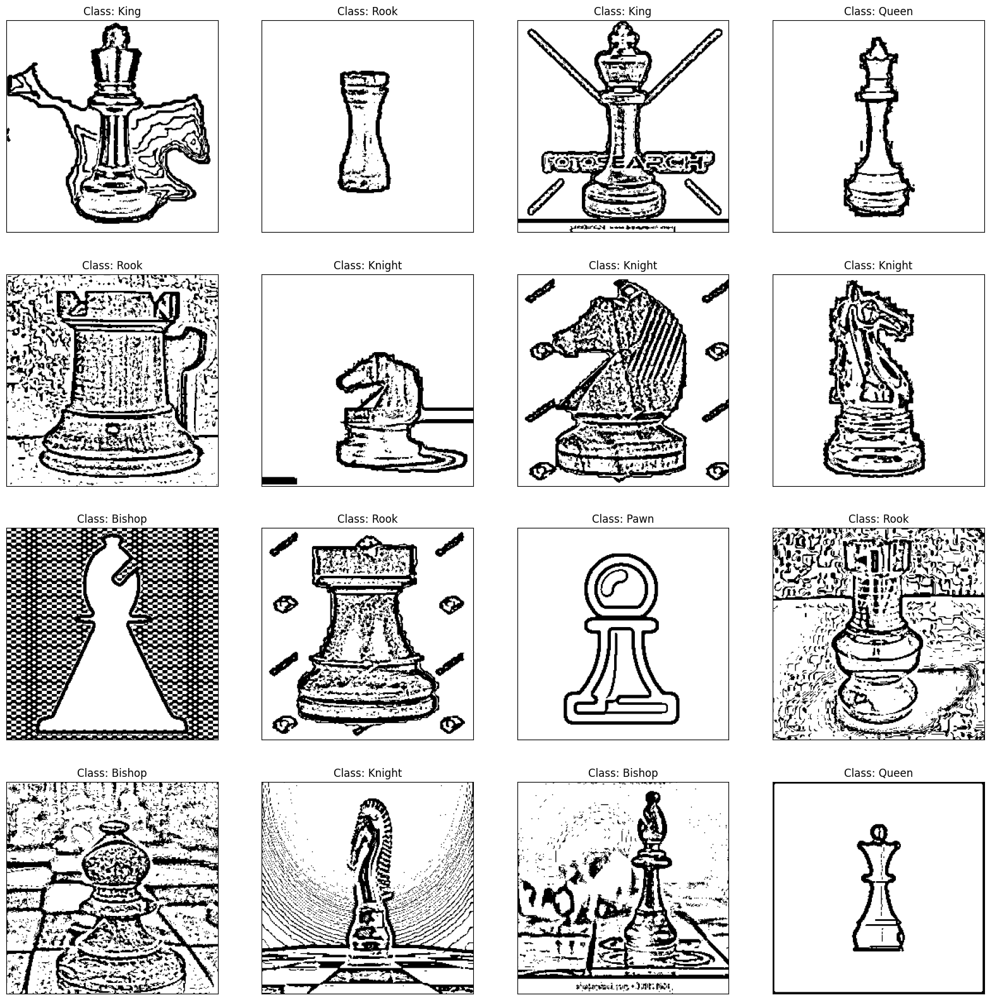

In [40]:
x = adaptive_thr(x)
show(x)

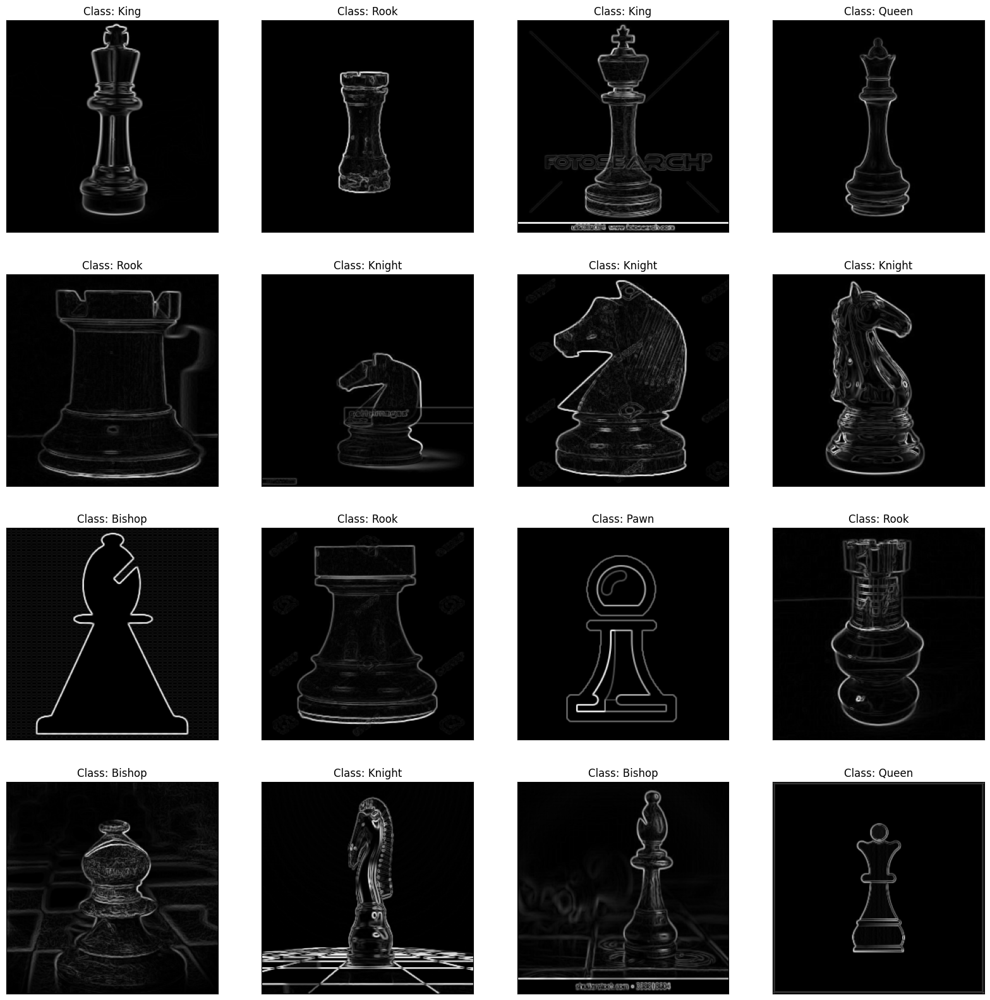

In [41]:
x = sobl(x)
show(x)

In [42]:
x = np.array(x)
x = x / 255.0  # Normalize to [0, 1]


In [43]:
y = np.array(y_train)
y

array([1, 5, 1, 4, 5, 2, 2, 2, 0, 5, 3, 5, 0, 2, 0, 4, 2, 5, 2, 1, 5, 3,
       1, 1, 0, 1, 1, 3, 3, 5, 3, 4, 5, 2, 3, 2, 4, 0, 3, 2, 3, 3, 0, 1,
       3, 1, 1, 3, 4, 5, 2, 4, 4, 3, 4, 3, 3, 2, 5, 4, 0, 5, 5, 0, 3, 3,
       2, 0, 1, 5, 3, 4, 1, 2, 3, 2, 5, 2, 3, 5, 5, 3, 1, 4, 0, 3, 3, 0,
       2, 0, 2, 4, 1, 1, 1, 0, 0, 0, 5, 2, 5, 0, 5, 5, 3, 3, 4, 3, 2, 3,
       1, 2, 5, 0, 2, 2, 3, 0, 3, 2, 3, 3, 5, 3, 3, 1, 3, 5, 1, 5, 0, 4,
       5, 2, 4, 2, 2, 5, 4, 5, 4, 4, 3, 2, 0, 4, 3, 2, 2, 3, 1, 3, 3, 0,
       2, 5, 3, 5, 5, 1, 3, 5, 3, 0, 0, 3, 4, 0, 2, 1, 5, 3, 2, 5, 1, 0,
       5, 0, 0, 3, 5, 3, 4, 5, 3, 2, 4, 1, 3, 4, 0, 1, 3, 5, 3, 0, 0, 2,
       5, 4, 0, 3, 3, 2, 3, 5, 5, 0, 5, 1, 3, 5, 2, 4, 3, 3, 5, 0, 2, 0,
       3, 1, 4, 4, 3, 1, 0, 5, 2, 1, 3, 3, 1, 5, 2, 0, 2, 4, 0, 4, 1, 5,
       3, 5, 4, 2, 1, 1, 0, 2, 2, 3, 1, 5, 0, 0, 5, 5, 5, 5, 3, 2, 5, 5,
       2, 3, 2, 5, 2, 4, 3, 3, 1, 5, 2, 0, 2, 5, 4, 3, 2, 1, 4, 3, 2, 0,
       4, 1, 4, 1, 0, 2, 0, 1, 3, 3, 5, 4, 0, 4, 1,

In [44]:
x = x.reshape(555, -1)

In [47]:
model = Sequential([
    Dense(128, activation='relu', input_shape=(256 * 256 * 1,)),  # Input size is flattened image
    Dense(64, activation='relu'),
    Dense(10, activation='softmax')  # Assuming 10 classes
])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [48]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(x, y, epochs=6, batch_size=16 )

Epoch 1/6


I0000 00:00:1734466078.002055     127 service.cc:145] XLA service 0x7e5788003560 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734466078.002112     127 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


29/35 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2059 - loss: 5.4437

I0000 00:00:1734466079.478157     127 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


35/35 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.2109 - loss: 5.1386
Epoch 2/6
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6604 - loss: 0.9782
Epoch 3/6
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8284 - loss: 0.5796
Epoch 4/6
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9696 - loss: 0.2540
Epoch 5/6
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9735 - loss: 0.1901
Epoch 6/6
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9770 - loss: 0.1708


In [53]:
model.save('/kaggle/working/model22.h5')

In [50]:
pred = model.predict(x)

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


In [51]:
pred = np.argmax(pred , axis = 1)

In [52]:
print(classification_report(y , pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99        86
           1       0.99      0.97      0.98        76
           2       0.99      0.99      0.99       106
           3       1.00      1.00      1.00       107
           4       0.97      1.00      0.99        78
           5       1.00      1.00      1.00       102

    accuracy                           0.99       555
   macro avg       0.99      0.99      0.99       555
weighted avg       0.99      0.99      0.99       555

